<h3>Calidad de un vino</h3>

a) Carge los dos dataset en un unico dataframe de pandas, ademas de agregar una columna indicando si
es vino tinto o blanco. Describa el dataset a trabajar.

In [2]:
import pandas as pd
df_red = pd.read_csv("winequality-red.csv",sep=";")
df_white = pd.read_csv("winequality-white.csv",sep=";")
df = pd.concat([df_red,df_white], axis=0,ignore_index=True)

In [3]:
from IPython.display import display, HTML

#-1 == red wine; +1 == white wine
df['tipo'] = ['-1' if cond < df_red.shape[0] else '+1' for cond in df.index.values]
display(df)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,tipo
0,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.400000,5,-1
1,7.8,0.880,0.00,2.60,0.098,25.0,67.0,0.99680,3.20,0.68,9.800000,5,-1
2,7.8,0.760,0.04,2.30,0.092,15.0,54.0,0.99700,3.26,0.65,9.800000,5,-1
3,11.2,0.280,0.56,1.90,0.075,17.0,60.0,0.99800,3.16,0.58,9.800000,6,-1
4,7.4,0.700,0.00,1.90,0.076,11.0,34.0,0.99780,3.51,0.56,9.400000,5,-1
5,7.4,0.660,0.00,1.80,0.075,13.0,40.0,0.99780,3.51,0.56,9.400000,5,-1
6,7.9,0.600,0.06,1.60,0.069,15.0,59.0,0.99640,3.30,0.46,9.400000,5,-1
7,7.3,0.650,0.00,1.20,0.065,15.0,21.0,0.99460,3.39,0.47,10.000000,7,-1
8,7.8,0.580,0.02,2.00,0.073,9.0,18.0,0.99680,3.36,0.57,9.500000,7,-1
9,7.5,0.500,0.36,6.10,0.071,17.0,102.0,0.99780,3.35,0.80,10.500000,5,-1


El dataset con el que se trabajará consta de atributos fisioquimicos del vino, además de la calidad y el tipo de vino (rojo o blanco), en total son 6497 vinos distintos con 11 atributos fisioquimicos.

b) Aborde este problema como si fuera de clasificacion binaria para predecir si un vino es de buena calidad
o no, es decir, utilice las distintas caracteristicas fisioquimicas presentes en los datos para estimar esta
etiqueta. Para esto cree las matrices de entrenamiento y de pruebas, ademas de la etiqueta para ambos
conjuntos, considerando como quality mayor a 5 un vino de buena calidad. El conjunto de pruebas
(25 %) sera utilizado unicamente para verificar la calidad de los algoritmos a entrenar.

Para esta parte se añade la columna 'good_quality', luego se crean los conjuntos de entrenamiento y prueba, para el conjunto de entrenamiento se eliminaron las columnas 'good_quality', 'quality' y 'tipo' ya que no son atributos fisioquimicos y para el conjunto de pruebas se eligio la columna 'good_quality' que es de tipo binario.

In [4]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
df['good_quality'] = [1 if q > 5 else 0 for q in df.quality]
#train, test = train_test_split(df, test_size=0.25)
X_train, X_test, y_train, y_test = train_test_split(df[df.columns.difference(['good_quality','quality','tipo'])], df['good_quality'], test_size=0.25, random_state = 50)
display(X_test)
print("red: %s, white: %s" % (X_test.loc[df['tipo'] == '-1'].shape[0],X_test.loc[df['tipo'] == '+1'].shape[0]))
print("train samples: %s, target: %s" % (X_train.shape, y_train.shape))
print("test samples: %s, target: %s" % (X_test.shape, y_test.shape))
X_train.head()

,alcohol,chlorides,citric acid,density,fixed acidity,free sulfur dioxide,pH,residual sugar,sulphates,total sulfur dioxide,volatile acidity
3419,12.000000,0.038,0.35,0.99120,6.8,10.0,3.09,2.80,0.53,164.0,0.300
834,9.400000,0.088,0.26,0.99694,8.8,16.0,3.32,1.60,0.47,23.0,0.685
5340,9.000000,0.051,0.28,0.99792,7.0,29.0,2.96,14.70,0.39,149.0,0.150
6363,11.400000,0.046,0.29,0.99224,5.9,34.0,3.24,5.40,0.41,116.0,0.260
3916,8.800000,0.045,0.62,0.99779,7.5,51.0,3.16,10.60,0.44,153.0,0.240
2164,10.000000,0.059,0.38,0.99670,7.8,28.0,3.12,10.30,0.47,99.0,0.220
1233,9.300000,0.057,0.37,0.99614,10.2,14.0,3.23,2.20,0.49,36.0,0.230
2334,9.600000,0.038,0.30,0.99480,6.4,15.0,3.14,5.50,0.49,129.0,0.250
4862,12.600000,0.030,0.31,0.99026,6.5,36.0,3.22,3.60,0.62,92.0,0.260
3989,10.700000,0.042,0.26,0.99250,7.0,34.0,3.43,1.70,0.50,130.0,0.280


red: 383, white: 1242
train samples: (4872, 11), target: (4872L,)
test samples: (1625, 11), target: (1625L,)


,alcohol,chlorides,citric acid,density,fixed acidity,free sulfur dioxide,pH,residual sugar,sulphates,total sulfur dioxide,volatile acidity
675,10.2,0.064,0.39,0.99840,9.3,12.0,3.26,2.2,0.65,31.0,0.41
3948,9.5,0.168,0.40,0.99782,7.9,19.0,3.06,10.1,0.62,184.0,0.46
1739,10.2,0.045,0.34,0.99270,6.3,20.0,3.30,2.2,0.43,77.0,0.31
2940,10.4,0.029,0.23,0.99310,7.6,13.0,3.04,2.0,0.33,151.0,0.54
6079,12.8,0.120,0.45,0.99636,5.9,55.0,3.10,22.6,0.35,122.0,0.22


c) Entrene un solo Arbol de Clasificacion de multiples niveles para resolver el problema. Puede variar los
hiper-parametros que prefiera, recuerde que las decisiones no pueden ser basadas mirando el conjunto
de pruebas. Debido al desbalanceo que se produce en las dos clases mida la metrica F1-score [5] sobre
el conjunto de entrenamiento y de pruebas.

Primero se experimenta con distintos valores para los hiper-parametros, y según los resultados obtenidos de la validación cruzada se eligé la mejor combinación encontrada.

In [142]:
from sklearn import tree
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
clf_tree = tree.DecisionTreeClassifier(
    criterion='entropy',
    splitter='best',
    min_samples_split = 2,
    max_depth = 25,
    min_samples_leaf = 1,
    random_state = 1,
    presort = True,
    min_impurity_split  = 0.49,
    max_features = None
    )
clf_tree = clf_tree.fit(X_train, y_train)
scores = cross_val_score(clf_tree, X_train, y_train, cv=10)
#clf_score_train = clf_tree.score(X_train, y_train)
print ("cross-validation: %s" % (scores))
print ("Accuracy: %0.5f (+/- %0.5f)" % (scores.mean(), scores.std() * 2))

cross-validation: [ 0.74385246  0.74385246  0.77254098  0.75359343  0.78234086  0.75564682
  0.7761807   0.72689938  0.78234086  0.76954733]
Accuracy: 0.76068 (+/- 0.03567)


Utilizando el modelo anterior se procede a evaluar en el conjunto de pruebas.

In [354]:
clf_score_test = clf_tree.score(X_test, y_test)
print ("score test: %s" % (clf_score_test))

def score_the_model(model,x,y,xt,yt):
    acc_tr = model.score(x,y)
    acc_test = model.score(xt[:-1],yt[:-1])
    print "Training Accuracy: %f"%(acc_tr)
    print "Test Accuracy: %f"%(acc_test)
    print "Detailed Analysis Testing Results ..."
    print(classification_report(yt, model.predict(xt), target_names=["-1","+1"]))
score_the_model(clf_tree, X_train, y_train, X_test, y_test)

score test: 0.799384615385
Training Accuracy: 0.953818
Test Accuracy: 0.799261
Detailed Analysis Testing Results ...
             precision    recall  f1-score   support

         -1       0.74      0.68      0.71       585
         +1       0.83      0.86      0.85      1040

avg / total       0.80      0.80      0.80      1625



El resultado obtenido en el conjunto de pruebas es de 79.9% de accuracy, sin embargo los datos estan desbalanceados, de hecho un clasificador aleatorio para este caso si solo diera como resultado '+1' tendria un accuracy aproximado del 66%
por lo que esta medida no es muy buen criterio para evaluar el modelo, sin embargo el f1-score el cual muestra el balance entre precision y recall dio como resultado 0.80, lo cual es bueno para este tipo de problemas.

d) Entrene un ensamblador de arboles de multiples niveles, mediante la tecnica de Random Forest. Varie la
cantidad de arboles de decision utilizados en el ensamblado (n_estimators), realice un grafico resumen
del F1-score de entrenamiento y de pruebas en funcion de este hiper-parametro.

Se realizan 15 iteraciones con cantidad de árboles variando desde 1 a 30 en números impares, no se realiza ningún ajuste de hiper-parámetros para poder comparar el ensamblador con el booster AdaBoostClassifier.

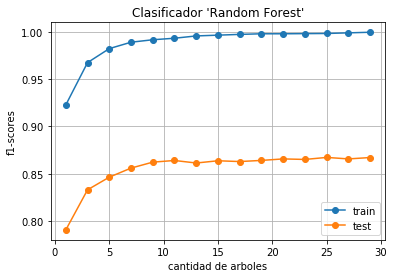

In [403]:
from sklearn.ensemble import RandomForestClassifier
import matplotlib.pyplot as plt

f1_scores_rfc_train = []
f1_scores_rfc_test = []
estimators_rfc = np.arange(start=1, stop=30, step=2, dtype=int)
for i in estimators_rfc:
    model = RandomForestClassifier(n_estimators=i,
                                   n_jobs=-1,
                                   random_state = 50)
    model.fit(X_train, y_train)
    f1_scores_rfc_train.append(f1_score(y_train, model.predict(X_train)))
    f1_scores_rfc_test.append(f1_score(y_test, model.predict(X_test)))
    
plt.figure()
plt.title("Clasificador 'Random Forest'")
plt.xlabel("cantidad de arboles")
plt.ylabel("f1-scores")
plt.grid()
plt.plot(estimators_rfc, f1_scores_rfc_train, 'o-', color="C0", label = "train")
plt.plot(estimators_rfc, f1_scores_rfc_test, 'o-', color="C1", label = "test")
plt.legend(loc="best")
plt.show()

Los resultados obtenidos muestran que el ensamblador llega al 100% de accuracy cuando se utilizan 29 árboles, sin embargo en el conjunto de prueba da como resultado que luego de utilizar 11 árboles ya no existe una mejora (86% accuracy), sin embargo si se ve una mejora significativa para una cantidad de árboles menores a 11.

e) Entrene un ensamblador de arboles de multiples niveles, mediante la tecnica de AdaBoost. Varie la
cantidad de arboles de decision utilizados en el ensamblado (n estimators), realice un grafico resumen
del F1-score de entrenamiento y de pruebas en funcion de este hiper-parametro. Compare y analice con
la tecnica utilizada en d).

Se utiliza el mismo criterio que en la parte anterior.

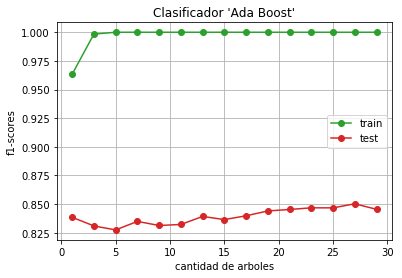

In [406]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

f1_scores_abc_train = []
f1_scores_abc_test = []
estimators_abc = np.arange(start=1, stop=30, step=2, dtype=int)
for i in estimators_abc:
    model = AdaBoostClassifier(base_estimator=clf_tree,
                               n_estimators=i,
                               random_state = 50
                              )
    model.fit(X_train, y_train)
    f1_scores_abc_train.append(f1_score(y_train, model.predict(X_train)))
    f1_scores_abc_test.append(f1_score(y_test, model.predict(X_test)))

plt.figure()
plt.title("Clasificador 'Ada Boost'")
plt.xlabel("cantidad de arboles")
plt.ylabel("f1-scores")
plt.grid()
plt.plot(estimators_abc, f1_scores_abc_train, 'o-', color="C2", label = "train")
plt.plot(estimators_abc, f1_scores_abc_test, 'o-', color="C3", label = "test")
plt.legend(loc="best")
plt.show()

En este caso se observa algo que es esperable, Ada Booster llega al 100% de accuracy con los datos de entrenamiento de forma exponencial, y a pesar de ello si se observa una ligera mejora en al aumentar la cantidad de árboles y esto se debe a que este booster es robusto a overfitting.

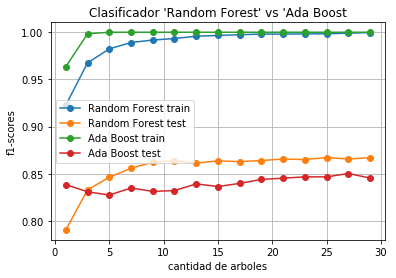

In [407]:
plt.figure()
plt.title("Clasificador 'Random Forest' vs 'Ada Boost")
plt.xlabel("cantidad de arboles")
plt.ylabel("f1-scores")
plt.grid()
plt.plot(estimators_rfc, f1_scores_rfc_train, 'o-', color="C0", label="Random Forest train")
plt.plot(estimators_rfc, f1_scores_rfc_test, 'o-', color="C1", label="Random Forest test")
plt.plot(estimators_abc, f1_scores_abc_train, 'o-', color="C2", label="Ada Boost train")
plt.plot(estimators_abc, f1_scores_abc_test, 'o-', color="C3", label="Ada Boost test")
plt.legend(loc="best")
plt.show()

Al comparar ambos clasificadores se tiene que random forest es mejor que adaboost en el conjunto de pruebas, que es esperable dada la mayor complejidad del ensamblador, sin embargo es posible que para una cantidad mucho mayor de arboles adaboost pueda tener mejores resultados.

f) Entrene alguna otra maquina de aprendizaje, elegida por usted, para resolver este problema. Elija los
hiper-parametros que estime convenientes intentando aumentar el F1-score obtenido por los algoritmos
anteriores. Compare y analice estas 4 maneras de resolver el problema definido en b).

Se eligío otro booster, GradientBoostingClassifier el cual es un sucesor de AdaBoostClassifier, para ver si es posible superar el desempeño de random forest con un booster. Antes de entrenar el modelo se intento encontrar los hiper-parámetros óptimos, para ello se realizaron distintas combinaciones de hiper-parámetros con los datos de prueba para encontrar el mejor n_estimators, max_depth, min_samples_leaf, min_samples_split y subsample.

In [458]:
from sklearn.grid_search import GridSearchCV
predictors = [x for x in df.columns if x not in ['good_quality', 'quality', 'tipo']]
param_test1 = {'n_estimators':range(500,701,40)}
gsearch1 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=0.1,
                                                               min_samples_split=500,
                                                               min_samples_leaf=50,
                                                               max_depth=8,
                                                               max_features='sqrt',
                                                               subsample=0.8,
                                                               random_state=10), 
                        param_grid = param_test1,
                        scoring='f1',
                        n_jobs=-1,
                        iid=False,
                        cv=5)
gsearch1.fit(X_train, y_train)
gsearch1.grid_scores_, gsearch1.best_params_, gsearch1.best_score_

([mean: 0.83475, std: 0.01398, params: {'n_estimators': 500},
  mean: 0.83425, std: 0.01340, params: {'n_estimators': 540},
  mean: 0.83616, std: 0.01158, params: {'n_estimators': 580},
  mean: 0.83704, std: 0.01213, params: {'n_estimators': 620},
  mean: 0.83769, std: 0.01130, params: {'n_estimators': 660},
  mean: 0.83719, std: 0.01241, params: {'n_estimators': 700}],
 {'n_estimators': 660},
 0.8376929689673144)

In [464]:
param_test2 = {'max_depth':range(17,33,4), 'min_samples_split':range(2,103,50)}
gsearch2 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=0.1,
                                                               n_estimators=660,
                                                               max_features='sqrt',
                                                               subsample=0.8,
                                                               random_state=10), 
                        param_grid = param_test2,
                        scoring='f1',
                        n_jobs=-1,
                        iid=False,
                        cv=5)
gsearch2.fit(X_train, y_train)
gsearch2.grid_scores_, gsearch2.best_params_, gsearch2.best_score_

([mean: 0.85479, std: 0.00914, params: {'min_samples_split': 2, 'max_depth': 17},
  mean: 0.84988, std: 0.01189, params: {'min_samples_split': 52, 'max_depth': 17},
  mean: 0.84208, std: 0.01061, params: {'min_samples_split': 102, 'max_depth': 17},
  mean: 0.85242, std: 0.00743, params: {'min_samples_split': 2, 'max_depth': 21},
  mean: 0.85155, std: 0.01021, params: {'min_samples_split': 52, 'max_depth': 21},
  mean: 0.84579, std: 0.00947, params: {'min_samples_split': 102, 'max_depth': 21},
  mean: 0.85894, std: 0.00923, params: {'min_samples_split': 2, 'max_depth': 25},
  mean: 0.84800, std: 0.00934, params: {'min_samples_split': 52, 'max_depth': 25},
  mean: 0.84604, std: 0.01174, params: {'min_samples_split': 102, 'max_depth': 25},
  mean: 0.86147, std: 0.01162, params: {'min_samples_split': 2, 'max_depth': 29},
  mean: 0.85094, std: 0.00999, params: {'min_samples_split': 52, 'max_depth': 29},
  mean: 0.84446, std: 0.01111, params: {'min_samples_split': 102, 'max_depth': 29}],
 {'

In [465]:
param_test3 = {'min_samples_split':range(2,103,50), 'min_samples_leaf':range(2,33,10)}
gsearch3 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=0.1,
                                                               n_estimators=660,
                                                               max_depth=29,
                                                               max_features='sqrt',
                                                               subsample=0.8,
                                                               random_state=10), 
                        param_grid = param_test3,
                        scoring='f1',
                        n_jobs=-1,
                        iid=False,
                        cv=5)
gsearch3.fit(X_train, y_train)
gsearch3.grid_scores_, gsearch3.best_params_, gsearch3.best_score_

([mean: 0.85674, std: 0.00783, params: {'min_samples_split': 2, 'min_samples_leaf': 2},
  mean: 0.85087, std: 0.01297, params: {'min_samples_split': 52, 'min_samples_leaf': 2},
  mean: 0.84706, std: 0.01038, params: {'min_samples_split': 102, 'min_samples_leaf': 2},
  mean: 0.85180, std: 0.00888, params: {'min_samples_split': 2, 'min_samples_leaf': 12},
  mean: 0.84865, std: 0.01142, params: {'min_samples_split': 52, 'min_samples_leaf': 12},
  mean: 0.84494, std: 0.01257, params: {'min_samples_split': 102, 'min_samples_leaf': 12},
  mean: 0.84874, std: 0.01394, params: {'min_samples_split': 2, 'min_samples_leaf': 22},
  mean: 0.84936, std: 0.01118, params: {'min_samples_split': 52, 'min_samples_leaf': 22},
  mean: 0.84760, std: 0.01167, params: {'min_samples_split': 102, 'min_samples_leaf': 22},
  mean: 0.84773, std: 0.01323, params: {'min_samples_split': 2, 'min_samples_leaf': 32},
  mean: 0.84773, std: 0.01323, params: {'min_samples_split': 52, 'min_samples_leaf': 32},
  mean: 0.8458

In [495]:
param_test4 = {'subsample':[0.6,0.7,0.75,0.8,0.85,0.9]}
gsearch4 = GridSearchCV(estimator = GradientBoostingClassifier(learning_rate=0.1,
                                                               n_estimators=660,
                                                               max_depth=29,
                                                               min_samples_split=2,
                                                               min_samples_leaf=2,
                                                               subsample=0.8,
                                                               random_state=10,
                                                               max_features=None),
                        param_grid = param_test4,
                        scoring='f1',
                        n_jobs=-1,
                        iid=False,
                        cv=5)
gsearch4.fit(X_train,y_train)
gsearch4.grid_scores_, gsearch4.best_params_, gsearch4.best_score_

([mean: 0.85088, std: 0.00943, params: {'subsample': 0.6},
  mean: 0.85136, std: 0.01045, params: {'subsample': 0.7},
  mean: 0.85389, std: 0.00967, params: {'subsample': 0.75},
  mean: 0.85543, std: 0.01030, params: {'subsample': 0.8},
  mean: 0.85410, std: 0.00817, params: {'subsample': 0.85},
  mean: 0.85203, std: 0.00849, params: {'subsample': 0.9}],
 {'subsample': 0.8},
 0.8554295656592241)

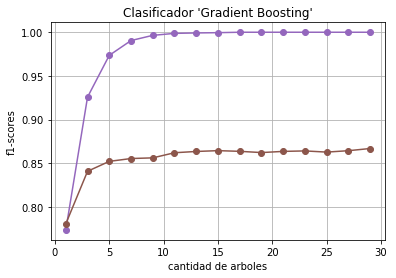

In [498]:
from sklearn.ensemble import GradientBoostingClassifier
f1_scores_gbc_train = []
f1_scores_gbc_test = []
estimators_gbc = np.arange(start=1, stop=30, step=2, dtype=int)
for i in estimators_abc:
    model = GradientBoostingClassifier(n_estimators=i, 
                                       #learning_rate=0.033*i,
                                       max_depth=29,
                                       random_state=50,
                                       min_samples_leaf = 2,
                                       min_samples_split = 2,
                                       subsample = 0.8,
                                      )
    model = model.fit(X_train, y_train)
    f1_scores_gbc_train.append(f1_score(y_train, model.predict(X_train)))
    f1_scores_gbc_test.append(f1_score(y_test, model.predict(X_test)))
    
    
plt.figure()
plt.title("Clasificador 'Gradient Boosting'")
plt.xlabel("cantidad de arboles")
plt.ylabel("f1-scores")
plt.grid()
plt.plot(estimators_gbc, f1_scores_gbc_train, 'o-', color="C4")
plt.plot(estimators_gbc, f1_scores_gbc_test, 'o-', color="C5")
plt.show()

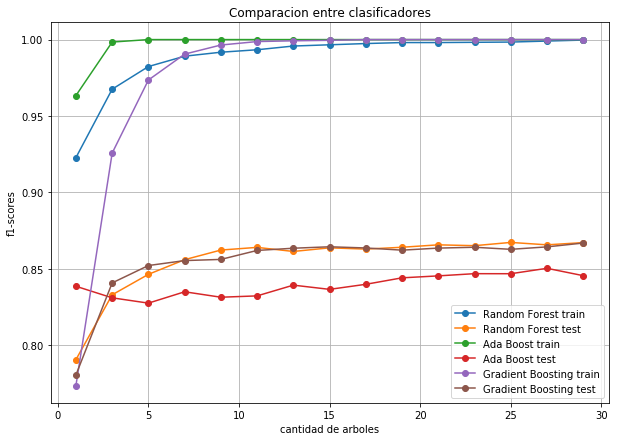

In [499]:
plt.figure(figsize=(10,7))
plt.title("Comparacion entre clasificadores")
plt.xlabel("cantidad de arboles")
plt.ylabel("f1-scores")
plt.grid()
plt.plot(estimators_rfc, f1_scores_rfc_train, 'o-', color="C0", label="Random Forest train")
plt.plot(estimators_rfc, f1_scores_rfc_test, 'o-', color="C1", label="Random Forest test")
plt.plot(estimators_abc, f1_scores_abc_train, 'o-', color="C2", label="Ada Boost train")
plt.plot(estimators_abc, f1_scores_abc_test, 'o-', color="C3", label="Ada Boost test")
plt.plot(estimators_gbc, f1_scores_gbc_train, 'o-', color="C4", label="Gradient Boosting train")
plt.plot(estimators_gbc, f1_scores_gbc_test, 'o-', color="C5", label="Gradient Boosting test")
plt.legend(loc="best")
plt.show()

Finalmente obtiene que el booster elegido es superior a su predecesor y tiene un desempeño a la par de random forest tanto en el conjunto de entrenamiento como en el de pruebas, esto debido en gran parte a la elección de los hiper-parámetros.

g) Defina un criterio para estimar la importancia de los distintos atributos en el ensamblado de Random Forest, implementelo sobre alguno de los ensambladores entrenados en d), haga un ranking de
importancia de atributos ¿Es posible implementar este criterio sobre una tecnica de boost como lo es
AdaBoost?

El criterio a utilizar no es el que utiliza sklearn, sino que 'Mean decrease accuracy', el cual consiste en medir que tanto afecta un atributo al desempeño del clasificador, para ello se compara el f1-score del clasificador con el f1-score del mismo pero utilizando datos de entrenamiento en el cual todos los datos de una columna son desordenados, esto se realiza para cada columna. Se realiza validación cruzada con 10 folds.

In [180]:
from sklearn.ensemble import RandomForestClassifier
from collections import defaultdict
from sklearn.model_selection import KFold
import collections

predictors = [x for x in df.columns if x not in ['good_quality', 'quality', 'tipo']]

def importancia(model):
    kf = KFold(n_splits=10)
    scores = defaultdict(list)
    for train, val in kf.split(X_train):
        r = model.fit(X_train.iloc[train], y_train.iloc[train])
        predicted = model.predict(X_train.iloc[val])
        acc = f1_score(y_train.iloc[val], predicted)
        for i in range(X_train.shape[1]):
            X_t = X_train.iloc[val].copy()
            random_column = X_t[predictors[i]].sample(frac=1)
            X_t[predictors[i]] = random_column.values
            predicted = model.predict(X_t)
            shuff_acc = f1_score(y_train.iloc[val], predicted)
            #print "%s : %s" % (acc, shuff_acc)
            scores[predictors[i]].append((acc-shuff_acc)/acc)
    sorted_score = sorted([(round(np.mean(score), 4), feat) for feat, score in scores.items()], reverse=True)
    sorted_score = collections.OrderedDict(sorted(sorted_score, reverse=True))
    
    scores_mean = sorted([(round(np.mean(score), 4)) for feat, score in scores.items()], reverse=True)
    scores_std = sorted([(round(np.std(score), 4)) for feat, score in scores.items()], reverse=True)
    score_names = []
    for i in sorted_score.values():
        score_names.append(i)
    return scores, score_names, scores_mean, scores_std

In [168]:
# Clasificador
rfc = RandomForestClassifier(n_estimators=25, n_jobs=4, random_state = 50)
rfc_scores, rfc_names, rfc_mean, rfc_std = importancia(rfc)
print "Atributos ordenados por importancia:"
print sorted([(round(np.mean(score), 4), feat) for feat, score in rfc_scores.items()], reverse=True)

Atributos ordenados por importancia:
[(0.0771, 'alcohol'), (0.0646, 'volatile acidity'), (0.0261, 'sulphates'), (0.0223, 'free sulfur dioxide'), (0.02, 'citric acid'), (0.019, 'total sulfur dioxide'), (0.019, 'density'), (0.0146, 'chlorides'), (0.0108, 'residual sugar'), (0.0068, 'pH'), (0.0062, 'fixed acidity')]


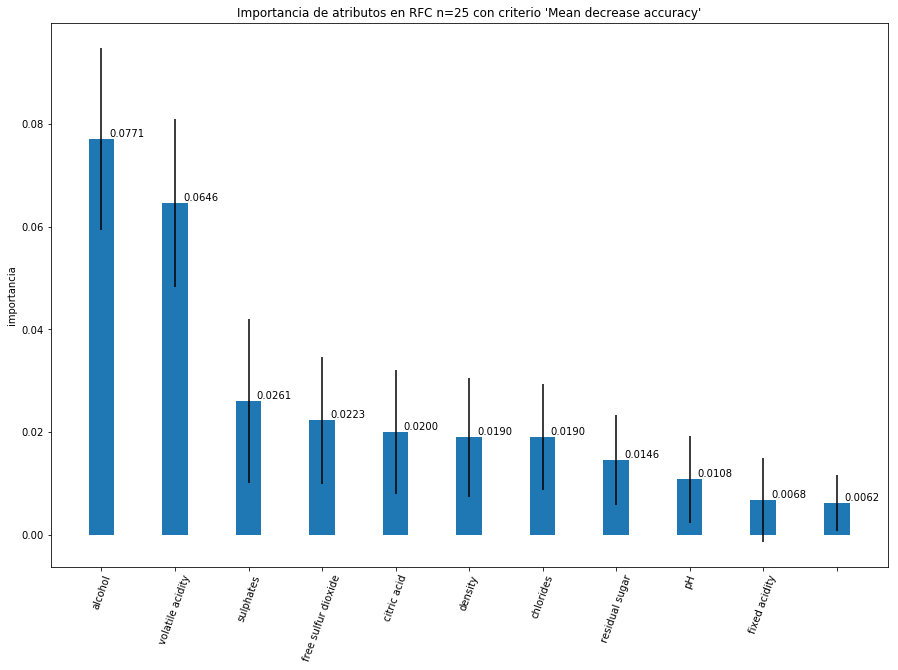

In [172]:
import matplotlib.pyplot as plt
# Grafico de importancia
ind = np.arange(11)
width = 0.35 
fig, ax = plt.subplots(figsize=(15,10))
rects1 = ax.bar(ind, rfc_mean, width=width, color='C0', yerr=rfc_std)
ax.set_ylabel('importancia')
ax.set_title("Importancia de atributos en RFC n=25 con criterio 'Mean decrease accuracy'")
ax.set_xticks(ind)
ax.set_xticklabels(rfc_names, rotation=70)

def autolabel(rects):
    """
    Attach a text label above each bar displaying its height
    """
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + 1.5*rect.get_width(), 1*height,
                '%.4f' % float(height),
                ha='center', va='bottom')
autolabel(rects1)

plt.show()

Antes que nada se debe corregir el gráfico ya que los 'ticks' de los atributos density, chlorides, residual sugar, ph y fixed acidity están corridos 1 posición a la izquierda, por lo que fixed acidity debiese ser 0.0062, ph debe ser 0.0068 y asi sucesivamente, en density deberia aparecer total sulfur dioxide con 0.0190

Se observa que existen 2 atributos que tienen mayor relevancia en el resultado del clasificador, mientras los demás tienen una importancia relativamente similar.

Se repite lo anterior pero para AdaBoost.

In [170]:
# Clasificador
from sklearn.ensemble import AdaBoostClassifier
abc = AdaBoostClassifier(base_estimator=clf_tree,n_estimators=25,random_state = 50)
abc_scores, abc_names, abc_mean, abc_std = importancia(abc)
print "Atributos ordenados por importancia:"
print sorted([(round(np.mean(score), 4), feat) for feat, score in abc_scores.items()], reverse=True)

Atributos ordenados por importancia:
[(0.0828, 'alcohol'), (0.063, 'volatile acidity'), (0.0544, 'density'), (0.0417, 'sulphates'), (0.0353, 'residual sugar'), (0.0352, 'total sulfur dioxide'), (0.0343, 'free sulfur dioxide'), (0.0339, 'chlorides'), (0.0232, 'citric acid'), (0.0202, 'pH'), (0.0188, 'fixed acidity')]


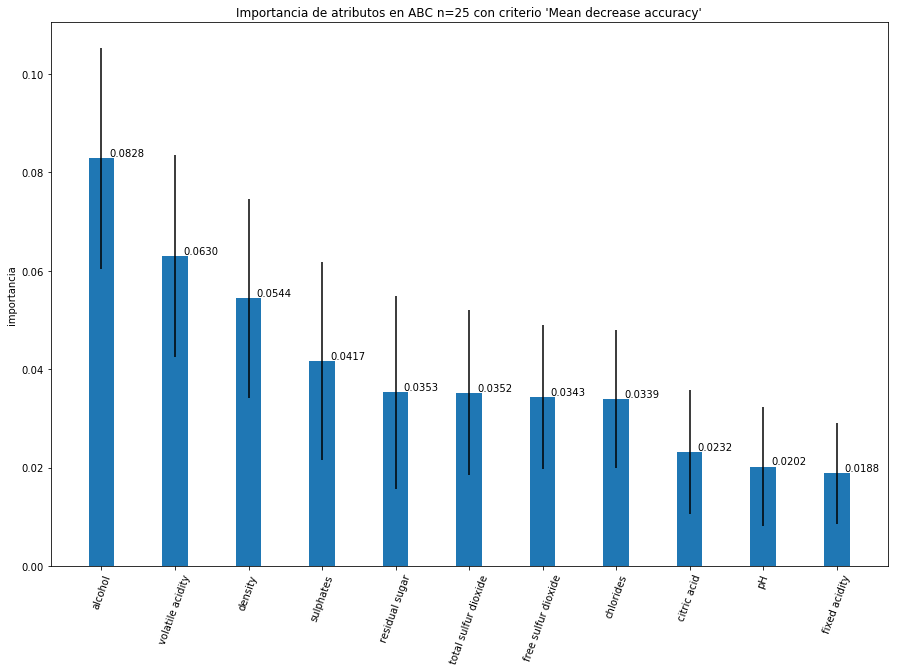

In [173]:
import matplotlib.pyplot as plt

# Grafico de importancia
ind = np.arange(11)
width = 0.35 
fig, ax = plt.subplots(figsize=(15,10))
rects1 = ax.bar(ind, abc_mean, width=width, color='C0', yerr=abc_std)
ax.set_ylabel('importancia')
ax.set_title("Importancia de atributos en ABC n=25 con criterio 'Mean decrease accuracy'")
ax.set_xticks(ind)
ax.set_xticklabels(abc_names, rotation=70)

def autolabel(rects):
    """
    Attach a text label above each bar displaying its height
    """
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + 1.5*rect.get_width(), 1*height,
                '%.4f' % float(height),
                ha='center', va='bottom')
autolabel(rects1)

plt.show()

En este caso se observa una mayor importancia para todos los atributos, a diferencia de random forest que se enfoca en mayormente en solo los 2 primeros atributos 'acohol' y 'volatile acidity'.

<h3>Reconocimiento de Imágenes Sign Gestures</h3>

a) Construya una funcion que cargue todos los datos de entrenamiento y pruebas del problema generando
como salida: (i) dos matrices Xtr; Ytr, correspondientes a las imagenes y etiquetas de entrenamiento,
(ii) dos matrices Xt; Yt, correspondientes a las imagenes y etiquetas de pruebas, y finalmente (iii) dos
matrices Xv; Yv, correspondientes a imagenes y etiquetas que se usaran como conjunto de validacion, es
decir para tomar decisiones de dise~no acerca del modelo. Este ultimo conjunto debe ser extraido desde
el conjunto de entrenamiento original y no debe superar las 7000 imagenes.

In [5]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from keras.utils import to_categorical
from keras import utils as np_utils

def load_data():
    train = np.array(pd.read_csv('sign_mnist_train.csv'))
    test = np.array(pd.read_csv('sign_mnist_test.csv'))
    msk = np.random.rand(len(train)) < 0.25
    y_tr = np_utils.to_categorical(train[:,0])[~msk]
    x_tr = train[:,1:][~msk]
    y_t = np_utils.to_categorical(test[:,0])
    x_t = test[:,1:]
    #you need to add Xval: x_v,y_v
    y_v = np_utils.to_categorical(train[:,0])[msk]
    x_v = train[:,1:][msk]
    return(x_tr,x_v,x_t,y_tr,y_v,y_t)
x_tr, x_v, x_t, y_tr, y_v , y_t = load_data()
print("train x: %s, validation x: %s, test x: %s" %(x_tr.shape, x_v.shape, x_t.shape))
print("train y: %s, validation y: %s, test y: %s" %(y_tr.shape, y_v.shape, y_t.shape))

train x: (20622, 784), validation x: (6833, 784), test x: (7172, 784)
train y: (20622, 25), validation y: (6833, 25), test y: (7172, 25)


b) Construya una funcion que escale apropiadamente las imagenes antes de trabajar. Experimente solo
escalando los datos de acuerdo a la intensidad maxima de pixel (i.e., dividiendo por 255) y luego
centrando y escalandolos como en actividades anteriores.

In [6]:
#pip install keras
#pip install np_utils
#pip install tensorflow
from keras.preprocessing.image import ImageDataGenerator

def preprocess(x):
    # Escala y centra los datos a [-1, 1]
    return x / 255. * 2 - 1

x_tr = preprocess(x_tr).reshape(x_tr.shape[0], 28, 28, 1)
x_v = preprocess(x_v).reshape(x_v.shape[0], 28, 28, 1)
x_t = preprocess(x_t).reshape(x_t.shape[0], 28, 28, 1)

print("train x: %s, validation x: %s, test x: %s" %(x_tr.shape, x_v.shape, x_t.shape))

datagen_tr = ImageDataGenerator(width_shift_range=0.1,
                                height_shift_range=0.1,
                                zoom_range=0.1
                               )

train x: (20622, 28, 28, 1), validation x: (6833, 28, 28, 1), test x: (7172, 28, 28, 1)


c) Diseñe, entrene y evalue una red neuronal para el problema partir de la representacion original de las
imagenes. Experimente con distintas arquitecturas, pre-procesamientos y metodos de entrenamiento, midiendo el error de clasificacion sobre el conjunto de validacion. En base a esta ultima medida de
desempeño, decida que modelo, de entre todos los evaluados, medira finalmente en el conjunto de test.
Reporte y discuta los resultados obtenidos. Se espera que logre obtener un error de pruebas menor o
igual a 0.2.

In [3]:
#pip install keras
#pip install np_utils
#pip install tensorflowfrom keras.models import Sequential

from keras.models import Sequential
from keras.layers import *
from keras.optimizers import SGD
from keras.utils.np_utils import to_categorical
from keras.models import model_from_json

#-------- 1er MODELO
model = Sequential()
model.add( Convolution2D(32, 5, 5, kernel_initializer='uniform', activation='relu', input_shape=(28, 28, 1)) )
model.add( MaxPooling2D() )
model.add( Convolution2D(32, 3, 3, kernel_initializer='uniform', activation='relu') )
model.add( MaxPooling2D() )
model.add( Flatten() ) 
model.add( Dense(output_dim=128, kernel_initializer='uniform', activation='relu') )
model.add( Dropout(0.5) )
model.add( Dense(output_dim=25, kernel_initializer='uniform', activation='softmax') )
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

print(model.summary())
model.fit_generator(datagen_tr.flow(x_tr, y_tr, batch_size=32),
                    len(x_tr),
                    epochs=2,
                    validation_data = (x_v, y_v)
                   )

# modelo en JSON
model_json = model.to_json()
with open("modelo-1.json", "w") as json_file:
    json_file.write(model_json)
# pesos en HDF5
model.save_weights("modelo-1.h5")
print("Saved model to disk")

#-------- 2do MODELO
model2 = Sequential()
model2.add( Convolution2D(32, 5, 5, kernel_initializer='uniform', activation='relu', input_shape=(28, 28, 1)) )
model2.add( MaxPooling2D() )
model2.add( Convolution2D(32, 3, 3, kernel_initializer='uniform', activation='relu') )
model2.add( MaxPooling2D() )
model2.add( Flatten() ) 
model2.add( Dense(output_dim=128, kernel_initializer='uniform', activation='relu') )
model2.add( Dropout(0.5) )
model2.add( Dense(output_dim=25, kernel_initializer='uniform', activation='softmax') )
model2.compile(optimizer=SGD(lr=0.05), loss='categorical_crossentropy', metrics=['accuracy'])
print(model2.summary())
model2.fit_generator(datagen_tr.flow(x_tr, y_tr, batch_size=32),
                     len(x_tr),
                     epochs=2,
                     validation_data = (x_v, y_v)
                    )

# modelo en JSON
model_json = model2.to_json()
with open("modelo-2.json", "w") as json_file:
    json_file.write(model_json)
# pesos en HDF5
model2.save_weights("modelo-2.h5")
print("Saved model to disk")

C:\Users\Paralizis\AppData\Local\Enthought\Canopy\edm\envs\python35\lib\site-packages\ipykernel\__main__.py:13: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (5, 5), kernel_initializer="uniform", input_shape=(28, 28, 1..., activation="relu")`
C:\Users\Paralizis\AppData\Local\Enthought\Canopy\edm\envs\python35\lib\site-packages\ipykernel\__main__.py:15: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), kernel_initializer="uniform", activation="relu")`
C:\Users\Paralizis\AppData\Local\Enthought\Canopy\edm\envs\python35\lib\site-packages\ipykernel\__main__.py:18: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(kernel_initializer="uniform", units=128, activation="relu")`
C:\Users\Paralizis\AppData\Local\Enthought\Canopy\edm\envs\python35\lib\site-packages\ipykernel\__main__.py:20: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(kernel_initializer="uniform", units=25, activation="softmax")`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 24, 24, 32)        832       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 12, 12, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 10, 10, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 5, 5, 32)          0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 800)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 128)               102528    
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
__________

C:\Users\Paralizis\AppData\Local\Enthought\Canopy\edm\envs\python35\lib\site-packages\ipykernel\__main__.py:40: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (5, 5), kernel_initializer="uniform", input_shape=(28, 28, 1..., activation="relu")`
C:\Users\Paralizis\AppData\Local\Enthought\Canopy\edm\envs\python35\lib\site-packages\ipykernel\__main__.py:42: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), kernel_initializer="uniform", activation="relu")`
C:\Users\Paralizis\AppData\Local\Enthought\Canopy\edm\envs\python35\lib\site-packages\ipykernel\__main__.py:45: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(kernel_initializer="uniform", units=128, activation="relu")`
C:\Users\Paralizis\AppData\Local\Enthought\Canopy\edm\envs\python35\lib\site-packages\ipykernel\__main__.py:47: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(kernel_initializer="uniform", units=25, activation="softmax")`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 24, 24, 32)        832       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 12, 12, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 10, 10, 32)        9248      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 5, 5, 32)          0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 800)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 128)               102528    
_________________________________________________________________
dropout_2 (Dropout)          (None, 128)               0         
__________

In [5]:
#-------- 3er MODELO
model3 = Sequential()
model3.add(Convolution2D(32, 5, 5, init='uniform', activation='relu', input_shape=(28, 28, 1)))
model3.add(Dense(30, input_shape=(28,28,1), init='uniform', activation='relu'))
model3.add(MaxPooling2D())
model3.add(Dense(30, init='uniform', activation='relu'))
model3.add(MaxPooling2D())
model3.add(Flatten())
model3.add(Dense(25, init='uniform', activation='softmax'))
model3.compile(optimizer=SGD(lr=0.05), loss='categorical_crossentropy', metrics=['accuracy'])
print(model3.summary())
model3.fit_generator(datagen_tr.flow(x_tr, y_tr, batch_size=32),
                     len(x_tr),
                     epochs=2,
                     validation_data = (x_v, y_v)
                    )

# modelo en JSON
model_json = model3.to_json()
with open("modelo-3.json", "w") as json_file:
    json_file.write(model_json)
# pesos en HDF5
model3.save_weights("modelo-3.h5")
print("Saved model to disk")

C:\Users\Paralizis\AppData\Local\Enthought\Canopy\edm\envs\python35\lib\site-packages\ipykernel\__main__.py:3: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (5, 5), input_shape=(28, 28, 1..., kernel_initializer="uniform", activation="relu")`
  app.launch_new_instance()
C:\Users\Paralizis\AppData\Local\Enthought\Canopy\edm\envs\python35\lib\site-packages\ipykernel\__main__.py:4: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(30, kernel_initializer="uniform", input_shape=(28, 28, 1..., activation="relu")`
C:\Users\Paralizis\AppData\Local\Enthought\Canopy\edm\envs\python35\lib\site-packages\ipykernel\__main__.py:6: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(30, kernel_initializer="uniform", activation="relu")`
C:\Users\Paralizis\AppData\Local\Enthought\Canopy\edm\envs\python35\lib\site-packages\ipykernel\__main__.py:9: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(25, kernel_initializer="uniform", activati

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 24, 24, 32)        832       
_________________________________________________________________
dense_8 (Dense)              (None, 24, 24, 30)        990       
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 12, 12, 30)        0         
_________________________________________________________________
dense_9 (Dense)              (None, 12, 12, 30)        930       
_________________________________________________________________
max_pooling2d_8 (MaxPooling2 (None, 6, 6, 30)          0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 1080)              0         
_________________________________________________________________
dense_10 (Dense)             (None, 25)                27025     
Total para

In [9]:
from keras.optimizers import SGD
from keras.models import model_from_json

#-------- 1er MODELO
# cargar modelo y pesos
json_file = open('modelo-1.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model1 = model_from_json(loaded_model_json)
model1.load_weights("modelo-1.h5")
print("Loaded model from disk")
model1.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
#-------- 2do MODELO
# cargar modelo y pesos
json_file = open('modelo-2.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model2 = model_from_json(loaded_model_json)
model2.load_weights("modelo-2.h5")
print("Loaded model from disk")
model2.compile(optimizer=SGD(lr=0.05), loss='categorical_crossentropy', metrics=['accuracy'])
#-------- 3er MODELO
# cargar modelo y pesos
json_file = open('modelo-3.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
model3 = model_from_json(loaded_model_json)
model3.load_weights("modelo-3.h5")
print("Loaded model from disk")
model3.compile(optimizer=SGD(lr=0.05), loss='categorical_crossentropy', metrics=['accuracy'])

#evaluar modelos
scores_1 = model1.evaluate(x_t, y_t, batch_size = 128)
print('loss = %f, acc = %f' % (scores_1[0],scores_1[1]))
scores_2 = model2.evaluate(x_t, y_t, batch_size = 128)
print('loss = %f, acc = %f' % (scores_2[0],scores_2[1]))
scores_3 = model3.evaluate(x_t, y_t, batch_size = 128)
print('loss = %f, acc = %f' % (scores_3[0],scores_3[1]))

Loaded model from disk
Loaded model from disk
Loaded model from disk
7172/7172 [==============================] - 3s 361us/step

El resultado obtenido es sospechosamente bueno, con un accuracy del 99.93% para el segundo modelo, sin embargo los resultados de todos los modelos en general son bastante buenos, todos mayores al 99%.

d) Para la mejor red entrenada anteriormente construya la matriz de confusion de las distintas clases, para
asi visualizar cuales son las clases mas dificiles de clasificar y con cuales se confunden. Comente.

In [17]:
import matplotlib.pyplot as plt
from tensorflow import confusion_matrix

signs = ['A','B','C','D','E','F','G','H','I','J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']

test = pd.read_csv('sign_mnist_test.csv')
y_test = test['label']
predictions = model2.predict_classes(x_t)
confusion_matrix = confusion_matrix(labels=y_test, predictions=predictions, num_classes=len(signs))

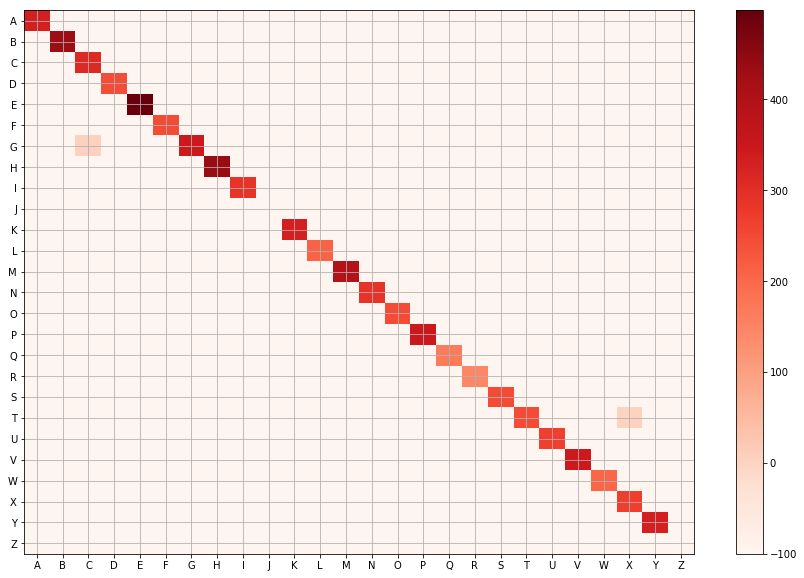

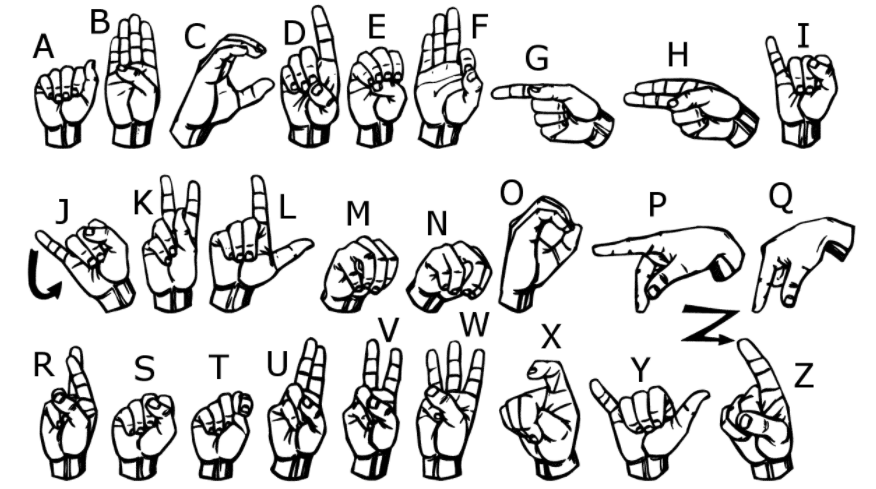

In [18]:
import tensorflow as tf
with tf.Session() as sess:
    confusion = tf.Tensor.eval(confusion_matrix)
    
conf = confusion
conf[conf <= 0] = -100
plt.figure(figsize=(15,10))
plt.imshow(conf, aspect='auto', cmap=plt.get_cmap('Reds'))
plt.colorbar()
plt.grid()
plt.xticks(np.arange(len(signs)), signs)
plt.yticks(np.arange(len(signs)), signs)
plt.show()
from IPython.display import Image
Image('1.png')

e) Entrene una SVM no lineal sobre los pixeles con y sin pre-procesamiento. Puede utilizar el conjunto de
validacifion para seleccionar hiper-parametros, como el nivel de regularizacion aplicado y/o la funcion
de kernel a utilizar.

In [33]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler

signs = ['A','B','C','D','E','F','G','H','I','J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']    

def score_the_model(model,x_train,y_train,x_val,y_val,x_test,y_test, labels=None):
    model.fit(x_train,y_train)
    acc_tr = model.score(x_train,y_train)
    acc_test = model.score(x_val[:-1],y_val[:-1])
    predicted_val = model.predict(x_val)
    print("Validation Accuracy: %f"%(acc_test))
    print("Detailed Analysis Validation Results ...")
    print(classification_report(y_val, predicted_val, target_names=signs))
    predicted_test = model.predict(x_test)
    confusion = confusion_matrix(y_test, predicted_test)
    conf = confusion
    conf[conf <= 0] = -100
    plt.figure(figsize=(15,10))
    plt.imshow(conf, aspect='auto', cmap=plt.get_cmap('Reds'))
    plt.colorbar()
    plt.grid()
    plt.xticks(np.arange(len(signs)), signs)
    plt.yticks(np.arange(len(signs)), signs)
    plt.show()
    print("Accuracy test: %0.6f" % accuracy_score(y_test, predicted_test))
    
def preprocess_2(x_train, x_val, x_test):
    scaler = StandardScaler().fit(x_train)
    x_train = scaler.transform(x_train)
    x_val = scaler.transform(x_val)
    x_test = scaler.transform(x_test)
    return (x_train, x_val, x_test)

def load_data_2():
    train = pd.read_csv('sign_mnist_train.csv')
    test = pd.read_csv('sign_mnist_test.csv')
    msk = np.random.rand(len(train)) < 0.25
    y_tr = train['label'][~msk]
    x_tr = train.iloc[:,1:][~msk]
    y_t = test['label']
    x_t = test.iloc[:,1:]
    #you need to add Xval: x_v,y_v
    y_v = train['label'][msk]
    x_v = train.iloc[:,1:][msk]
    return(x_tr,x_v,x_t,y_tr,y_v,y_t)
x_train, x_val, x_test, y_train, y_val , y_test = load_data_2()
print("train x: %s, validation x: %s, test x: %s" %(x_train.shape, x_val.shape, x_test.shape))
print("train y: %s, validation y: %s, test y: %s" %(y_train.shape, y_val.shape, y_test.shape))

train x: (20550, 784), validation x: (6905, 784), test x: (7172, 784)
train y: (20550,), validation y: (6905,), test y: (7172,)


Validation Accuracy: 0.997683
Detailed Analysis Validation Results ...
             precision    recall  f1-score   support

          A       1.00      1.00      1.00       281
          B       1.00      1.00      1.00       249
          C       1.00      1.00      1.00       272
          D       1.00      1.00      1.00       281
          E       1.00      0.99      1.00       248
          F       1.00      1.00      1.00       318
          G       1.00      1.00      1.00       261
          H       1.00      1.00      1.00       266
          I       1.00      1.00      1.00       268
          J       1.00      1.00      1.00       294
          K       1.00      1.00      1.00       306
          L       1.00      1.00      1.00       254
          M       0.99      0.99      0.99       316
          N       1.00      1.00      1.00       283
          O       1.00      1.00      1.00       269
          P       0.97      1.00      0.98       319
          Q       1.00     

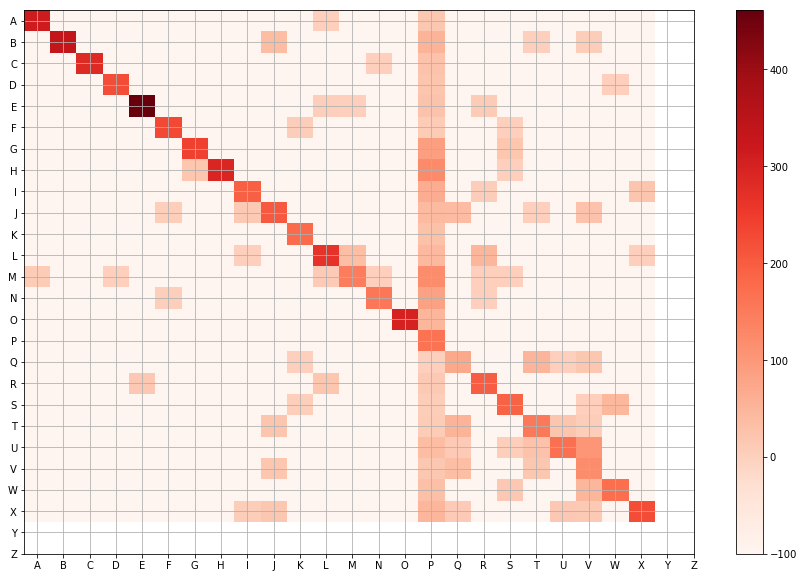

Accuracy test: 0.737451


In [35]:
from sklearn.svm import SVC
x_train_pre, x_val_pre, x_test_pre = preprocess_2(x_train, x_val, x_test)
svm = SVC(probability=False,
          kernel="rbf",
          C=2.8,
          gamma=.0073)
score_the_model(svm, x_train_pre, y_train, x_val_pre, y_val, x_test_pre, y_test)

Validation Accuracy: 0.107908
Detailed Analysis Validation Results ...
             precision    recall  f1-score   support

          A       1.00      0.05      0.09       281
          B       1.00      0.08      0.14       249
          C       1.00      0.07      0.13       272
          D       1.00      0.08      0.15       281
          E       1.00      0.06      0.11       248
          F       1.00      0.06      0.11       318
          G       1.00      0.07      0.14       261
          H       1.00      0.06      0.11       266
          I       1.00      0.08      0.15       268
          J       1.00      0.06      0.12       294
          K       1.00      0.05      0.09       306
          L       1.00      0.06      0.12       254
          M       1.00      0.06      0.11       316
          N       1.00      0.06      0.11       283
          O       1.00      0.08      0.15       269
          P       0.05      1.00      0.09       319
          Q       1.00     

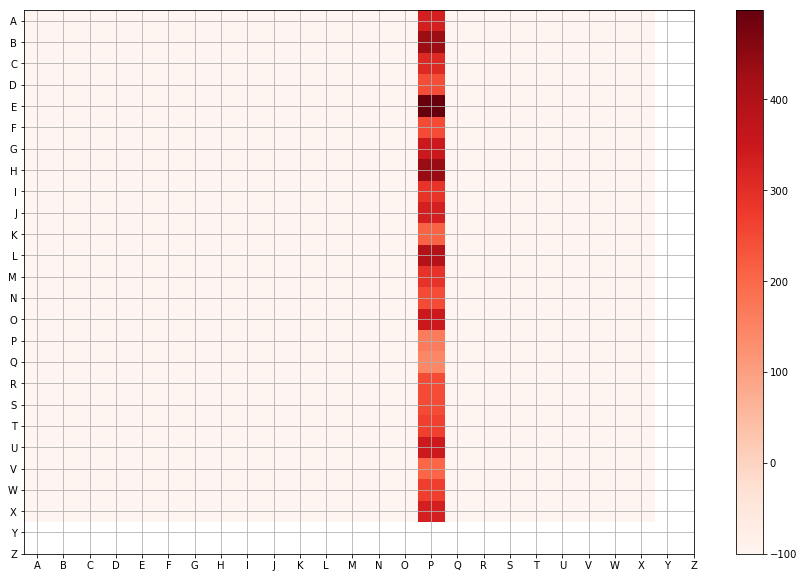

Accuracy test: 0.022867


In [36]:
from sklearn.svm import SVC
svm = SVC(probability=False,
          kernel="rbf",
          C=2.8,
          gamma=.0073)
score_the_model(svm, x_train, y_train, x_val, y_val, x_test, y_test)

f) Entrene una arbol de clasificacion sobre los pixeles con y sin pre-procesamiento. Puede utilizar el
conjunto de validacion para seleccionar hiper-parametros, como la profundidad maxima del arbol.

Validation Accuracy: 0.554822
Detailed Analysis Validation Results ...
             precision    recall  f1-score   support

          A       0.71      0.64      0.67       291
          B       0.63      0.59      0.61       247
          C       0.79      0.78      0.79       269
          D       0.52      0.64      0.57       289
          E       0.56      0.62      0.59       259
          F       0.63      0.59      0.61       318
          G       0.62      0.67      0.65       269
          H       0.61      0.40      0.48       258
          I       0.47      0.44      0.45       274
          J       0.60      0.39      0.47       294
          K       0.58      0.51      0.55       290
          L       0.38      0.57      0.46       262
          M       0.56      0.56      0.56       282
          N       0.72      0.66      0.69       293
          O       0.78      0.61      0.69       275
          P       0.80      0.76      0.78       336
          Q       0.26     

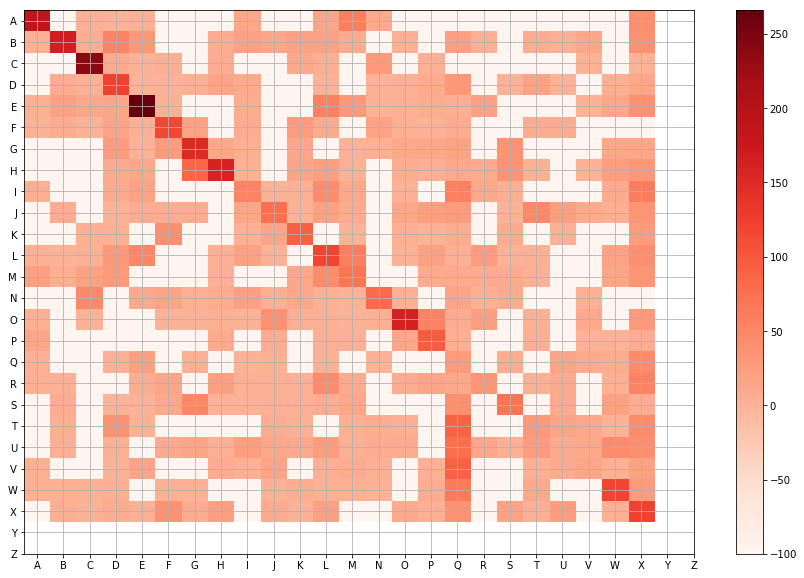

Accuracy test: 0.360151
max depth: 10


In [30]:
x_train_pre, x_val_pre, x_test_pre = preprocess_2(x_train, x_val, x_test)
clf_tree_pre = DecisionTreeClassifier(criterion='gini',
                                      splitter='best',
                                      min_samples_split = 2,
                                      max_depth = 10,
                                      min_samples_leaf = 1,
                                      random_state = 1,
                                      presort = True,
                                      min_impurity_split  = 0.49,
                                      max_features = None)
score_the_model(clf_tree_pre, x_train_pre, y_train, x_val_pre, y_val, x_test_pre, y_test)
print("max depth: %s" % clf_tree_pre.tree_.max_depth)

Validation Accuracy: 0.536873
Detailed Analysis Validation Results ...
             precision    recall  f1-score   support

          A       0.80      0.60      0.68       286
          B       0.79      0.58      0.67       255
          C       0.63      0.79      0.70       269
          D       0.61      0.53      0.57       308
          E       0.63      0.59      0.61       260
          F       0.61      0.50      0.54       301
          G       0.60      0.79      0.68       261
          H       0.54      0.64      0.59       229
          I       0.37      0.48      0.42       295
          J       0.74      0.36      0.48       289
          K       0.82      0.53      0.64       321
          L       0.52      0.41      0.46       267
          M       0.66      0.49      0.56       286
          N       0.71      0.66      0.68       288
          O       0.77      0.58      0.66       265
          P       0.75      0.68      0.71       339
          Q       0.68     

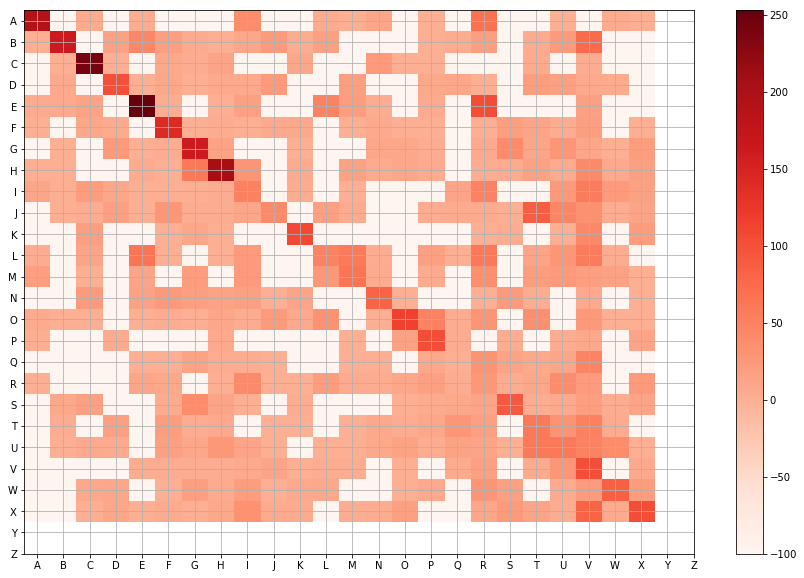

Accuracy test: 0.362242
max depth: 10


In [27]:
from sklearn.tree import DecisionTreeClassifier
clf_tree = DecisionTreeClassifier(criterion='gini',
                                  splitter='best',
                                  min_samples_split = 2,
                                  max_depth = 10,
                                  min_samples_leaf = 1,
                                  random_state = 1,
                                  presort = True,
                                  min_impurity_split  = 0.49,
                                  max_features = None)
score_the_model(clf_tree, x_train, y_train, x_val, y_val, x_test, y_test)
print("max depth: %s" % clf_tree.tree_.max_depth)